https://youtu.be/SuDtHqtC5OE

Reinhard color transfer
Based on the paper: https://www.cs.tau.ac.il/~turkel/imagepapers/ColorTransfer.pdf

This approach is suitable for stain normalization of pathology images where
the 'look and feel' of all images can be normalized to a template image.
This can be a good preprocessing step for machine learning and deep learning
of pathology images.


In [2]:
import numpy as np
import cv2
import os
from glob import glob

In [3]:
input_dir = r"\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles"

input_image_list = sorted(glob(os.path.join(input_dir,'*.tif')))
# input_image_list = os.listdir(input_dir)

# output_dir = "data/stain_normalization/"

In [4]:
input_image_list

['\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0272_eyes1.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0273_bone.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0281_eyes2.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0308_liver1.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0323_ears1.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0344_brain1.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0380_heart1.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0381_thymus.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fetus_40_0426_lungs.tif',
 '\\\\10.99.68.178\\andreex\\data\\Stardist\\Testing\\monkey\\tiles\\monkey_fet

In [5]:
def get_mean_and_std(x):
	x_mean, x_std = cv2.meanStdDev(x)
	x_mean = np.hstack(np.around(x_mean,2))
	x_std = np.hstack(np.around(x_std,2))
	return x_mean, x_std

In [6]:
pth_template = r'\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0451_heart2.tif'

template_img = cv2.imread(pth_template)
template_img = cv2.cvtColor(template_img,cv2.COLOR_BGR2LAB)
template_mean, template_std = get_mean_and_std(template_img)

In [7]:
unnormalized = input_image_list

In [8]:
import matplotlib.pyplot as plt

def show_tile(tile, **kwargs):
    """Plot a single image."""
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    ax.imshow(tile, **kwargs)
    plt.tight_layout()
    ax.set_axis_off()
    plt.show()

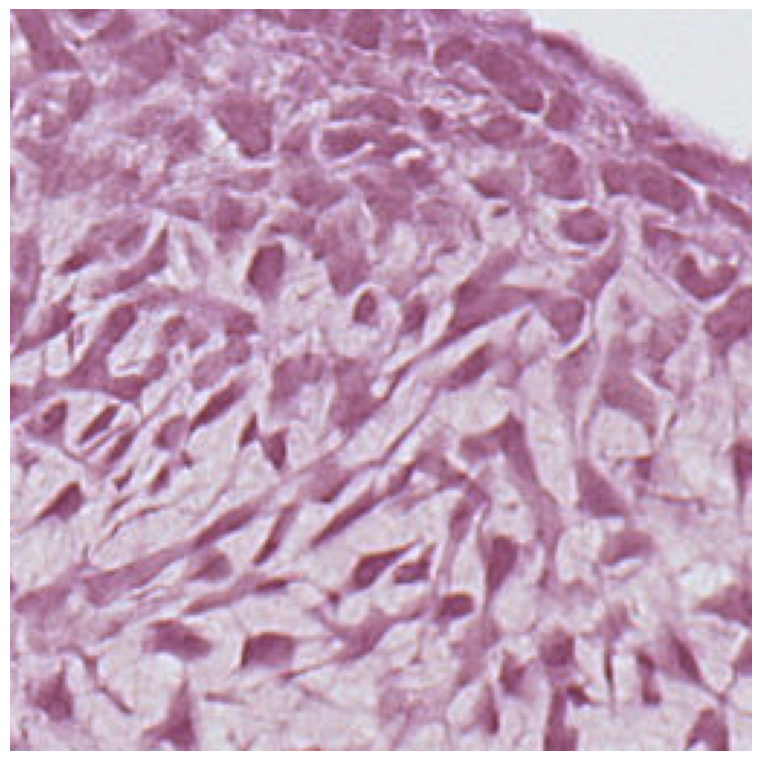

In [9]:
pth_template = r'\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0451_heart2.tif'

show_tile(cv2.imread(pth_template))

In [11]:
from tifffile import imread

normalized = []

for img in input_image_list:
    print(img)
    input_img = imread(img)
    input_img = cv2.cvtColor(input_img,cv2.COLOR_BGR2LAB)


    img_mean, img_std = get_mean_and_std(input_img)


    height, width, channel = input_img.shape
    for i in range(0,height):
        for j in range(0,width):
            for k in range(0,channel):
            	x = input_img[i,j,k]
            	x = ((x-img_mean[k])*(template_std[k]/img_std[k]))+template_mean[k]
            	x = round(x)
            	# boundary check
            	x = 0 if x<0 else x
            	x = 255 if x>255 else x
            	input_img[i,j,k] = x

    input_img= cv2.cvtColor(input_img,cv2.COLOR_LAB2BGR)
    normalized.append(input_img)
    # cv2.imwrite(output_dir+"modified_"+img, input_img)

\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0272_eyes1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0273_bone.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0281_eyes2.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0308_liver1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0323_ears1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0344_brain1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0380_heart1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0381_thymus.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0426_lungs.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0428_thyroid1.tif
\\10.99.68.178\andreex\data\Stardist\Testing\monkey\tiles\monkey_fetus_40_0451_heart2.tif
\\10.99.68.178

In [12]:
def show_tile(tile1, tile2, **kwargs):
    """Plot a pair of images."""
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    ax[0].imshow(tile1, **kwargs)
    ax[1].imshow(tile2, **kwargs)

    for a in ax:
        a.set_axis_off()
        a.set_aspect('auto')  # Ensure aspect ratio is maintained

    plt.tight_layout()
    plt.show()

In [13]:
from tifffile import imread

HE_original_tiles = list(map(imread,unnormalized))

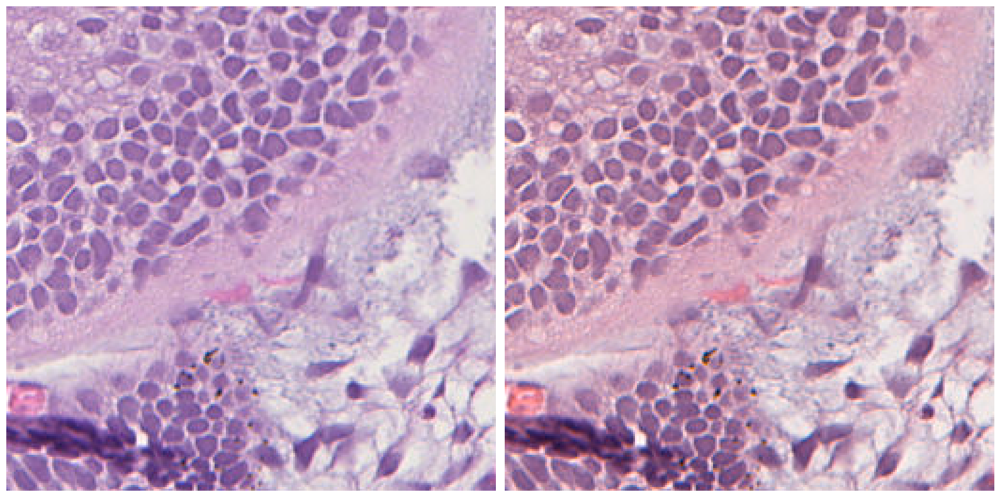

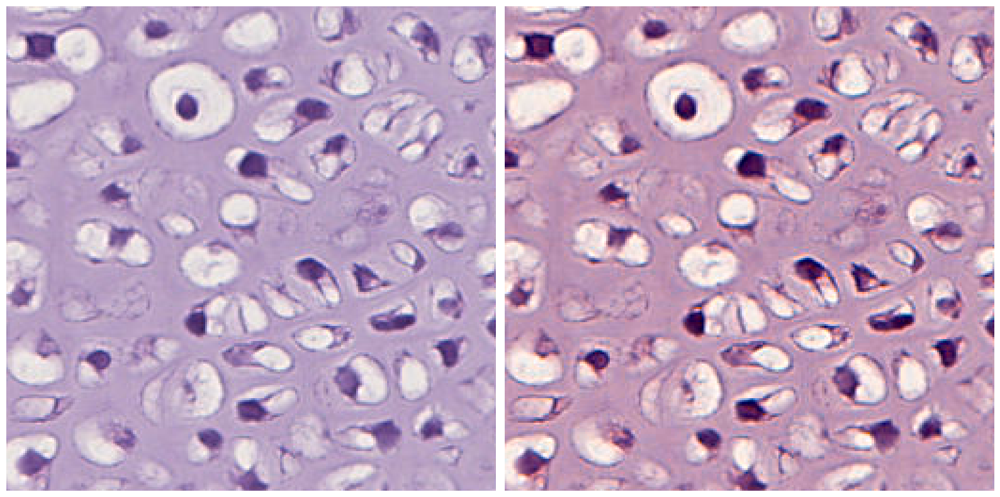

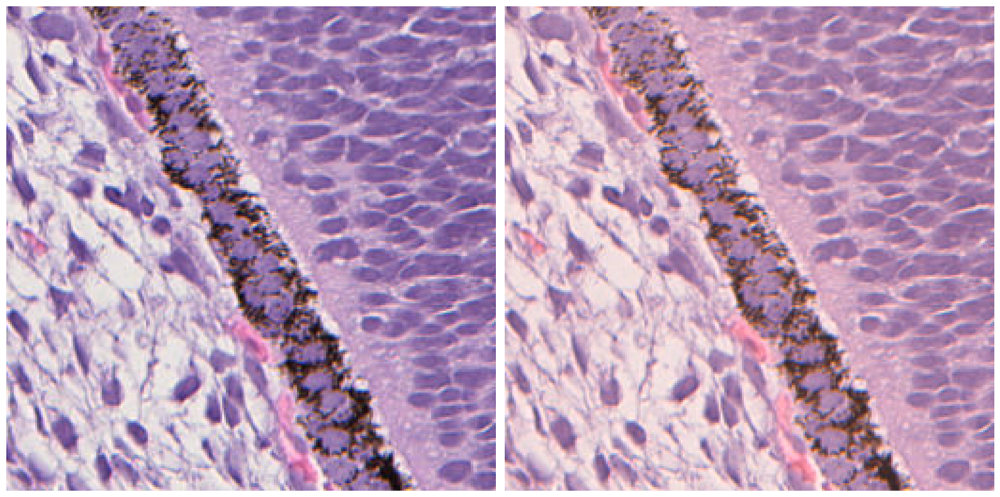

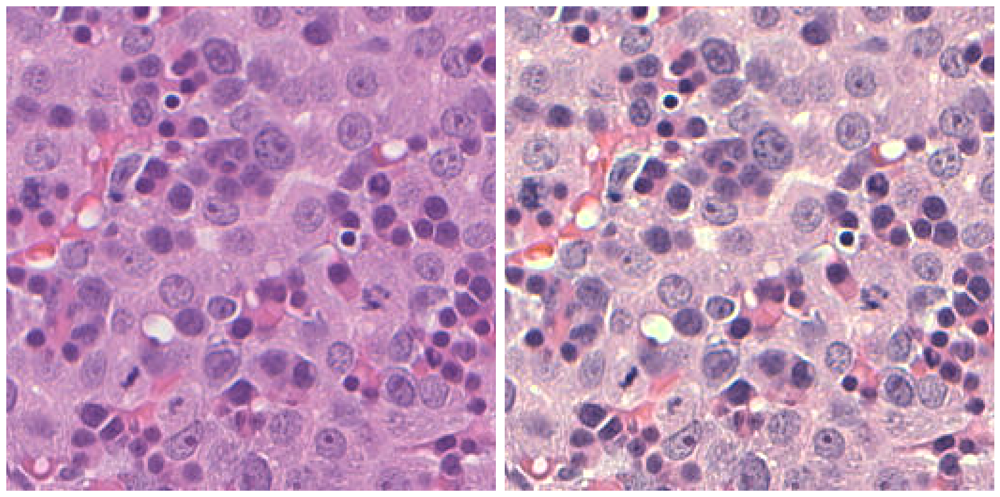

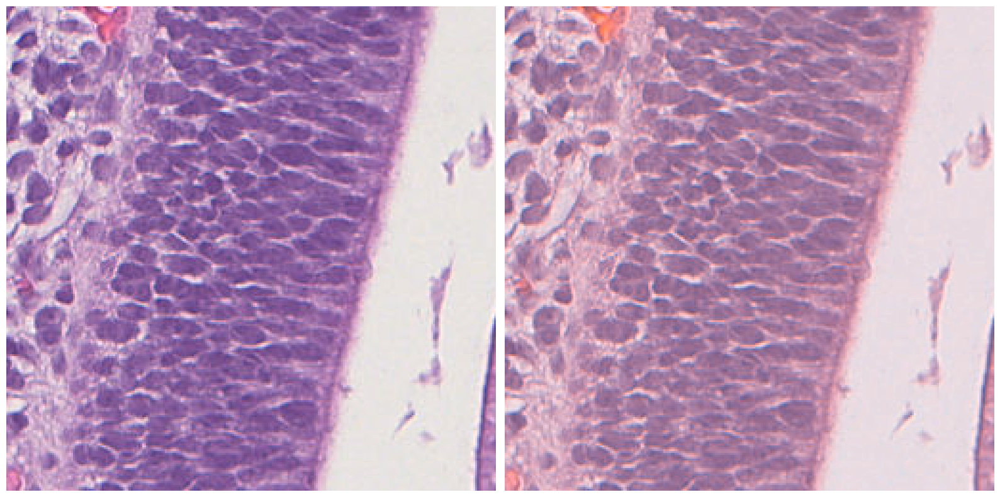

...

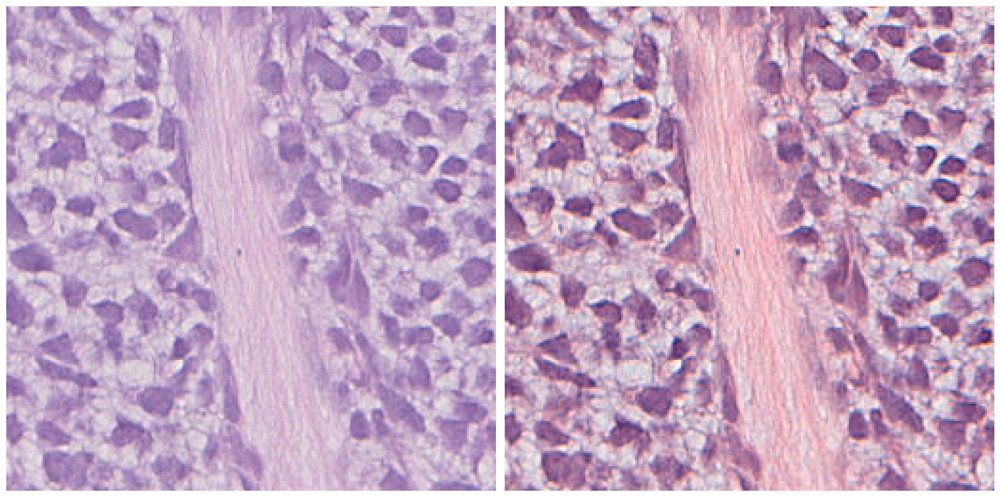

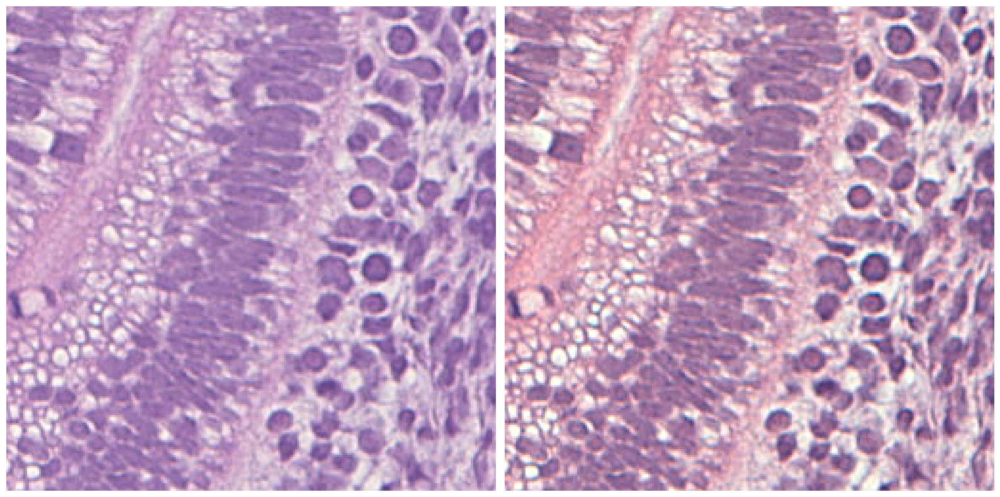

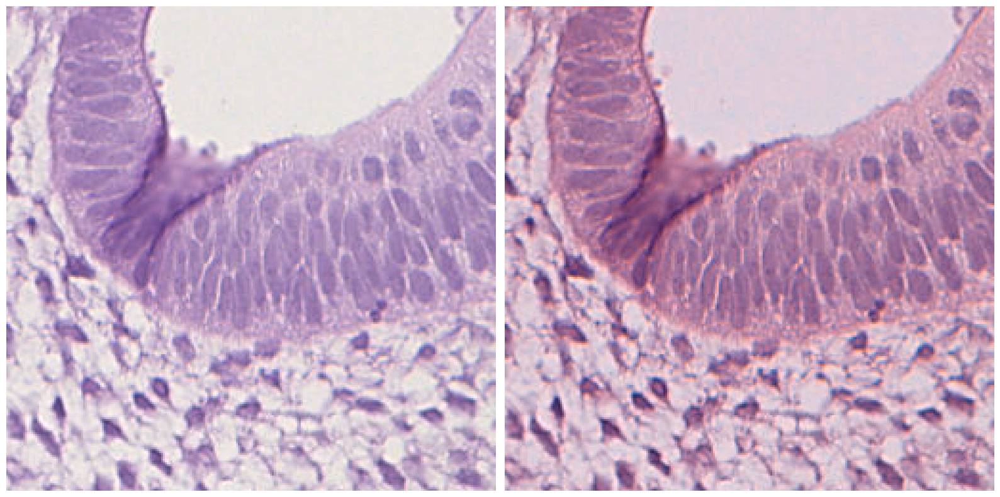

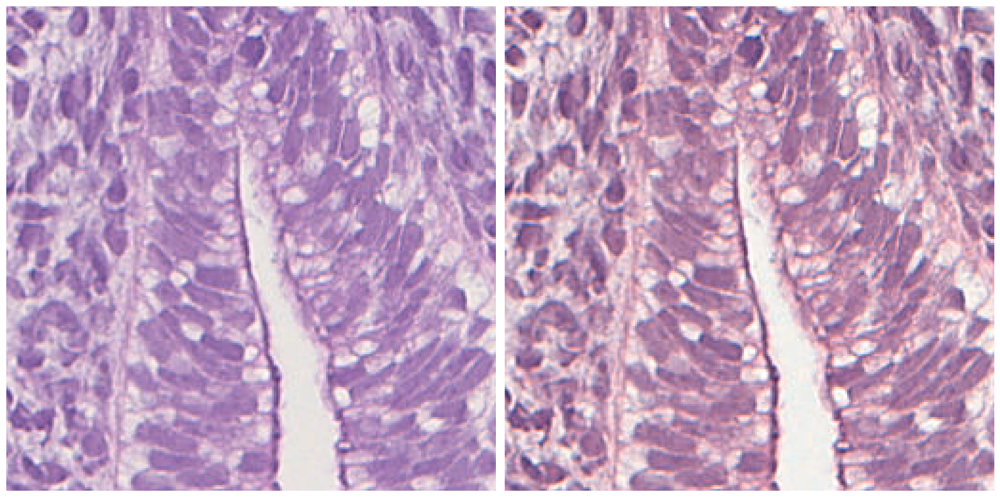

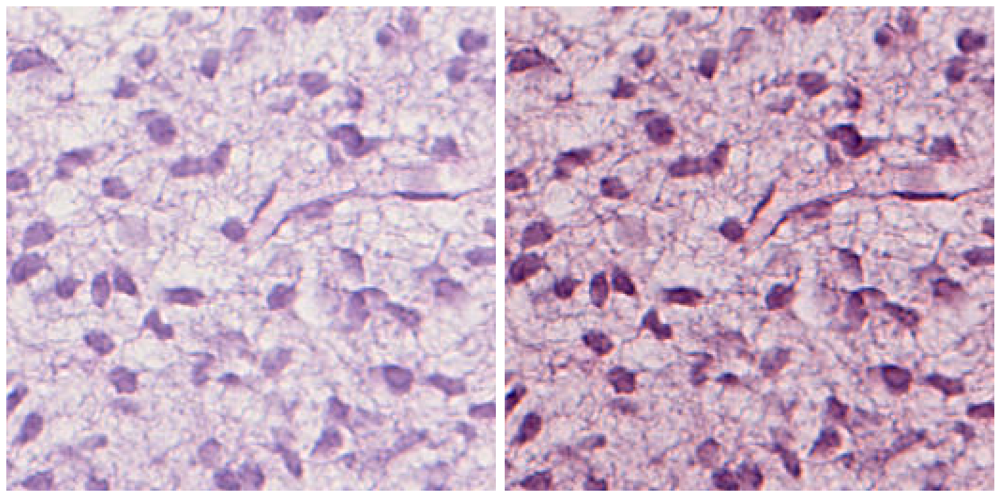

In [15]:
for i in range(len(HE_original_tiles)):
    show_tile(HE_original_tiles[i], normalized[i])